In [1]:
# Imports 
from Models.model import DQNAgent
from IPython.display import Image
from Utility import wrappers
import matplotlib.pyplot as plt
import PIL
import imageio
import numpy as np
import pandas as pd
import gym

# Initializing the wrapped environment.
env = wrappers.wrap_deepmind(gym.make("BreakoutDeterministic-v4"))

Using TensorFlow backend.


In [2]:
# Print the action space and action's meaning.
print("Total number of actions:", env.action_space.n, "\n")
for i in range(len(env.unwrapped.get_action_meanings())):
    print("Action", i, ":", "'{}'".format(env.unwrapped.get_action_meanings()[i]))

Total number of actions: 4 

Action 0 : 'NOOP'
Action 1 : 'FIRE'
Action 2 : 'RIGHT'
Action 3 : 'LEFT'


In [3]:
# Print the preprocessed starting state
state = np.array(env.reset())
state = np.expand_dims(np.array(state), axis=0)
print("Dimension of the preprocessed state:", state.shape)

Dimension of the preprocessed state: (1, 84, 84, 4)


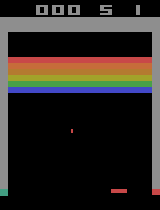

Score achieved by random agent:  0.0


In [4]:
"""Watch a random agent play breakout"""

# To test the agents's performance, we need a different wrapper for the environment, 
# where the rewards are not scaled, and the episode resets on true game over.
env_test = wrappers.wrap_deepmind_test(gym.make("BreakoutDeterministic-v4"))

state = env_test.reset()
renders = []
score = 0
while(True):
    renders.append(PIL.Image.fromarray(env_test.render(mode='rgb_array')))
    _, reward, done, _ = env_test.step(env_test.action_space.sample())
    score += reward
    if done:
        env.close()
        break

file_path = "./gifs/random_agent.gif"
imageio.mimsave(file_path, renders, fps=30)

with open(file_path,'rb') as f:
        display(Image(data=f.read(), format='png'))

print("Score achieved by random agent: ", score)

In [5]:
# Creating the agent 
agent = DQNAgent(env)

W0815 04:44:09.244693 4743722432 deprecation_wrapper.py:119] From /Users/apoorvmalik/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0815 04:44:09.258404 4743722432 deprecation_wrapper.py:119] From /Users/apoorvmalik/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0815 04:44:09.260396 4743722432 deprecation_wrapper.py:119] From /Users/apoorvmalik/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0815 04:44:09.370972 4743722432 deprecation_wrapper.py:119] From /Users/apoorvmalik/anaconda3/lib/python3.7/site-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W081

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 20, 20, 32)        8224      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 9, 9, 32)          16416     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 32)          9248      
_________________________________________________________________
flatten_1 (Flatten)          (None, 1568)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               401664    
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 4)                 516       
Total para

W0815 04:44:09.601341 4743722432 deprecation_wrapper.py:119] From /Users/apoorvmalik/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0815 04:44:09.602054 4743722432 deprecation_wrapper.py:119] From /Users/apoorvmalik/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.




conv2d_6 (Conv2D)            (None, 7, 7, 32)          9248      
_________________________________________________________________
flatten_2 (Flatten)          (None, 1568)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               401664    
_________________________________________________________________
dense_5 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_6 (Dense)              (None, 4)                 516       
Total params: 468,964
Trainable params: 468,964
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# 1st training session
# Training for 50k episodes
agent.run(num_episodes = 50000, mode = "train", weights_path = "./weights/model_weights_1", scores_path = "./logs/score_1")

Episode 32183/50000 | Episode Score: 3.0 | Min. Score: 0.0 | Max. Score: 14.0 | Current Avg. Score: 3.41 | Max. Average Score: 3.6 | epsilon: 0.2000495426038135298

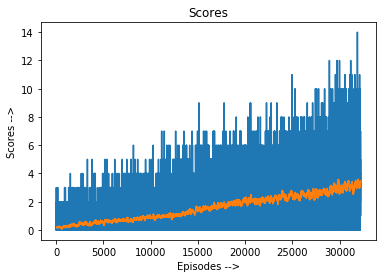

In [6]:
# Training was interrupted 
# Elapsed time: 45 hrs
# Epsison: 0.2 | Max. Score: 14 | Max. Average Score: 3.6
# plotting the scores
data = pd.read_csv("./logs/score_1").values.flatten()
agent.plot_scores(data)

In [7]:
# Loading the model's weights trained so far
agent.model.load_weights("./weights/model_weights_1")
# Resetting the epsilon
agent.reset_exploration(epsilon=0.25)

In [ ]:
# 2nd training session
agent.run(num_episodes = 30000, mode = "train", weights_path = "./weights/model_weights_2", scores_path = "./logs/score_2")

Episode 25423/30000 | Episode Score: 5.0 | Min. Score: 0.0 | Max. Score: 30.0 | Current Avg. Score: 5.39 | Max. Average Score: 6.89 | epsilon: 0.070124984166491285

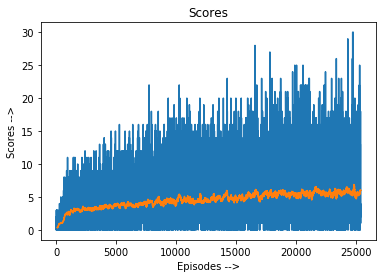

In [8]:
# Training was interrupted 
# Elapsed time: 60hrs
# Epsison: 0.2 | Max. Score: 30 | Max. Average Score: 6.89
# plotting the scores
data = pd.read_csv("./logs/score_2").values.flatten()
agent.plot_scores(data)

In [9]:
# Loading the model's weights trained so far
agent.model.load_weights("./weights/model_weights_2")
# Resetting the epsilon
agent.reset_exploration(epsilon=0.05)

In [ ]:
# 3rd training session
agent.run(num_episodes = 30000, mode = "train", weights_path = "./weights/model_weights_3", scores_path = "./logs/score_3")

Episode 9180/30000 | Episode Score: 2.0 | Min. Score: 0.0 | Max. Score: 35.0 | Current Avg. Score: 6.15 | Max. Average Score: 7.56 | epsilon: 0.0315953996735991164

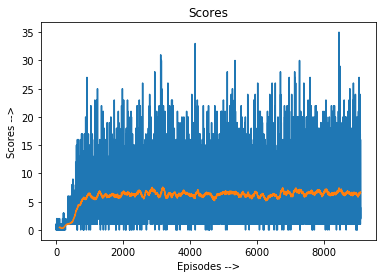

In [10]:
# Training was interrupted 
# Elapsed time: 72hrs
# Epsison: 0.2 | Max. Score: 35 | Max. Average Score: 7.56
# plotting the scores
data = pd.read_csv("./logs/score_3").values.flatten()
agent.plot_scores(data)

In [11]:
# To test the agents's performance, we need a different wrapper for the environment, 
# where the rewards are not scaled between -1 and +1
env_test = wrappers.wrap_deepmind_test(gym.make("BreakoutDeterministic-v4"))

# Create a new instance of the model (agent), for testing its performance.
agent_test = DQNAgent(env_test)

# Loading the best model weights trained so far.
agent_test.model.load_weights("./weights/model_weights_3")

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 20, 20, 32)        8224      
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 9, 9, 32)          16416     
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 7, 7, 32)          9248      
_________________________________________________________________
flatten_3 (Flatten)          (None, 1568)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 256)               401664    
_________________________________________________________________
dense_8 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_9 (Dense)              (None, 4)                 516       
Total para

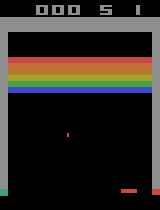

Score achieved by Intelligent agent:  83.0


In [12]:
"""Evaluation of the model""" 

# Run the simulation
renders, score = agent_test.run(num_episodes=5, mode='test')

# Make a .gif file from the frames
file_path = "./gifs/intelligent_agent.gif"
imageio.mimsave(file_path, renders, fps=60)

# Watch an intellgent agent play breakout.
with open(file_path,'rb') as f:
        display(Image(data=f.read(), format='png'))

print("Score achieved by Intelligent agent: ", score)